# No Attention and No Aug

## Custom Parameters
Here you can change some of the main parameters of the model

In [1]:
width = 256
height = 256

epochs = 20

batch_size = 16
learning_rate = 0.01

show_images = True

### Imports

In [2]:
from PIL import Image
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage
from torchvision.utils import save_image
from torchvision import ops
import cv2
import sys

sys.path.append(r'D:\Estudos\IC\CNN\CNN\Model')
from TrainingDataArrangement import arrange_data
from torchvision.transforms import v2
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import os
import numpy as np
import CustomDataset
from UNetModel import UNet
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random

#defining device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.9 (you have 1.4.8). Upgrade using: pip install --upgrade albumentations


Using cuda device


### Setting the seed

In [3]:
def set_seed(seed):  
    random.seed(seed) #setting for albumentations
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(727)

### Getting the dataset

Target path already exists. Please delete it first if you want to re-arrange the data, exiting...
Target path already exists. Please delete it first if you want to re-arrange the data, exiting...
Showing images: True
Getting the images
Converting images to tensors


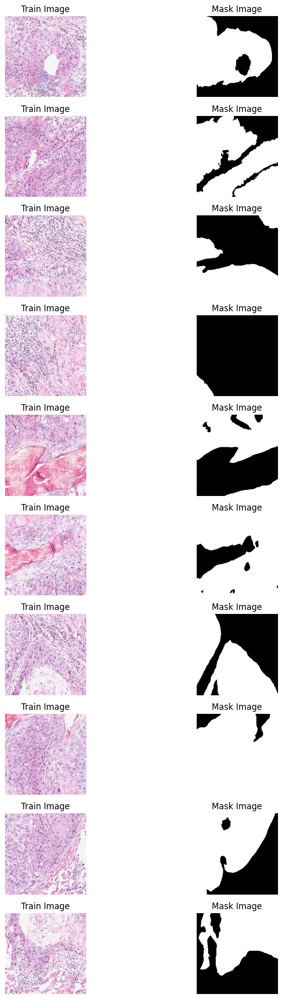

In [4]:
#getting path references
testing_folders = [
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009009\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009010x1000902\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009011\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009014\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009016x1000903\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009023\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009009\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009010x1000902\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009011\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009014\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009016x1000903\02-non_roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\testing\tumor\patch\640x640\1009023\02-non_roi"
]

training_folders = [
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\01-roi",
    r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\01-roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009009\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009010x1000902\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009011\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009014\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009016x1000903\02-non_roi",
    # r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\training\tumor\patch\640x640\1009023\02-non_roi"
]

updated_training_folders = []
updated_testing_folders = []

for training_folder, testing_folder in zip(training_folders, testing_folders):
    original_training_folder = training_folder + "\\01-original"
    mask_training_folder = training_folder + "\\02-mask"
    updated_training_folders.extend([original_training_folder, mask_training_folder])

    original_testing_folder = testing_folder + "\\01-original"
    mask_testing_folder = testing_folder + "\\02-mask"
    updated_testing_folders.extend([original_testing_folder, mask_testing_folder])

training_path = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\training"
test_path = r"D:\Estudos\IC\DataSets\H&E-stained oral squamous cell carcinoma histological images dataset\H&E-stained oral squamous cell carcinoma histological images dataset\appended_folder\testing"

arrange_data(test_path,updated_testing_folders)
arrange_data(training_path,updated_training_folders)

#data augmentation
augmentation_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    # A.HorizontalFlip(p=0.5),
    # A.VerticalFlip(p=0.25),
    # A.RandomRotate90(p=0.5),
    # A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    # A.Transpose(p=0.5),
    # A.RandomResizedCrop(224, 224, scale=(0.8, 1.0)),
    # A.GridDistortion(num_steps=5, distort_limit=(-0.3, 0.3), interpolation=1, border_mode=4, p=0.3),
    # A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, interpolation=1, border_mode=4, p=0.3),
    # A.OpticalDistortion(distort_limit=(-0.05, 0.05), shift_limit=(-0.05, 0.05), interpolation=1, border_mode=4, p=0.3),
    # A.Perspective(scale=(0.05, 0.1), keep_size=True, pad_mode=0, pad_val=0, mask_pad_val=0, fit_output=False, interpolation=1, p=0.3),
    # A.PiecewiseAffine (scale=(0.03, 0.05), nb_rows=4, nb_cols=4, interpolation=1, mask_interpolation=0, cval=0, cval_mask=0, mode='constant', absolute_scale=False, keypoints_threshold=0.01, p=0.1),
    # A.ShiftScaleRotate (shift_limit=(-0.0625, 0.0625), scale_limit=(-0.1, 0.1), rotate_limit=(-45, 45), interpolation=1, border_mode=4, value=0, mask_value=0, rotate_method='largest_box', p=0.15),
    ToTensorV2()  # loading image to tensor and normalization
])
test_transform = A.Compose([
    #A.ToPIL(),
    A.Resize(width = width, height = height, p=1.0),
    # A.HorizontalFlip(p=0.5),
    # A.VerticalFlip(p=0.25),
    ToTensorV2()  # loading image to tensor and normalization
])

print("Showing images:", show_images)

print("Getting the images")
training_dataset = CustomDataset.CustomImageDataset(training_path + "\\images", training_path + "\\masks", transform=augmentation_transform)
test_dataset = CustomDataset.CustomImageDataset(test_path + "\\images", test_path + "\\masks", transform=test_transform)

print("Converting images to tensors")
train_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset , batch_size=batch_size, shuffle=True)
if(show_images):
    num_images_to_display = 10
    fig, axs = plt.subplots(num_images_to_display, 2, figsize=(10, 20))
    for i in range(num_images_to_display):
        train_image, mask_image = training_dataset[i]
        train_image = train_image.permute(1, 2, 0).numpy()

        axs[i, 0].imshow(train_image)
        axs[i, 0].set_title('Train Image')
        axs[i, 0].axis('off')

        mask_image = mask_image.squeeze(0).numpy()
        axs[i, 1].imshow(mask_image, cmap='gray')
        axs[i, 1].set_title('Mask Image')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()


### Training

Epoch 1 Loss: 0.5626, Accuracy: 69.02%
Epoch 1 Validation Loss: 0.5016, Validation Accuracy: 76.06%, Dice: 0.7337%, IOU: 0.5689%, PQ: 0.5387, aji 0.3373%, Specificity: 0.4273%, Sensitivity: 0.7538%


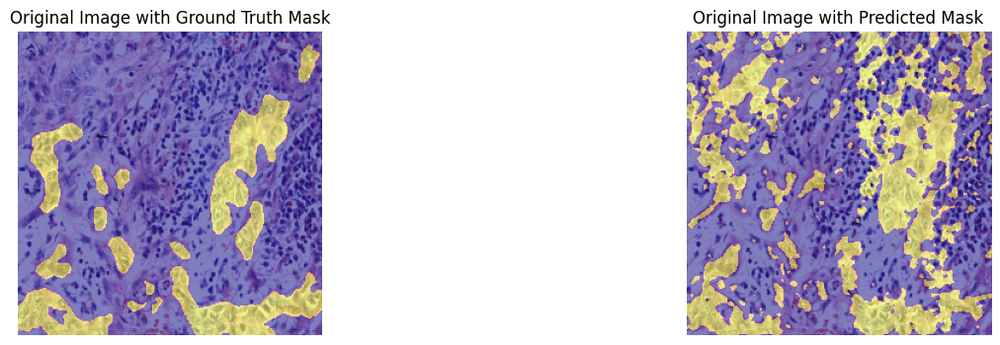

Epoch 2 Loss: 0.4790, Accuracy: 77.09%
Epoch 2 Validation Loss: 0.4173, Validation Accuracy: 81.07%, Dice: 0.7738%, IOU: 0.6315%, PQ: 0.6000, aji 0.3966%, Specificity: 0.5939%, Sensitivity: 0.7402%


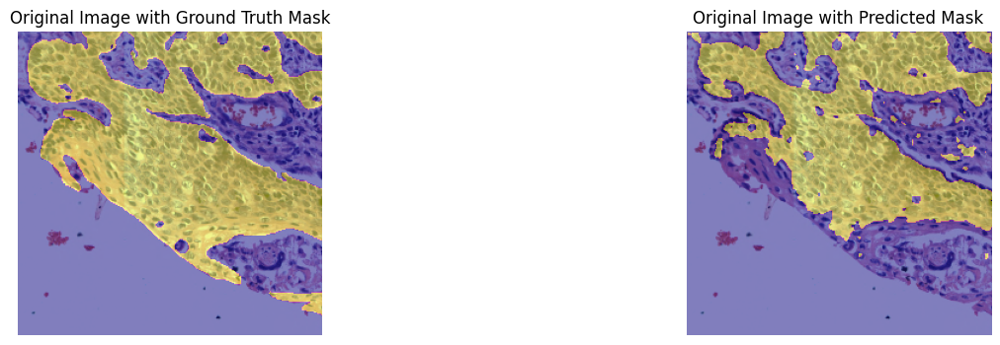

Epoch 3 Loss: 0.4369, Accuracy: 80.35%
Epoch 3 Validation Loss: 0.3932, Validation Accuracy: 82.01%, Dice: 0.7675%, IOU: 0.6243%, PQ: 0.5993, aji 0.3995%, Specificity: 0.7652%, Sensitivity: 0.6787%


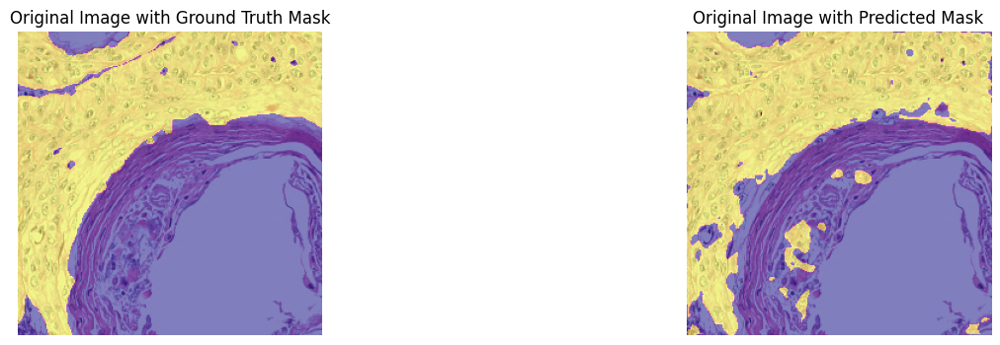

Epoch 4 Loss: 0.4093, Accuracy: 81.96%
Epoch 4 Validation Loss: 0.3321, Validation Accuracy: 86.47%, Dice: 0.8409%, IOU: 0.7249%, PQ: 0.7077, aji 0.5277%, Specificity: 0.6647%, Sensitivity: 0.8180%


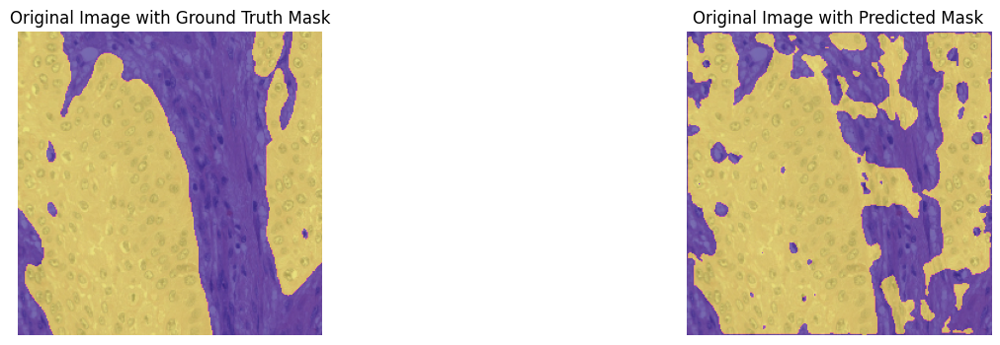

Epoch 5 Loss: 0.3965, Accuracy: 83.01%
Epoch 5 Validation Loss: 0.3268, Validation Accuracy: 86.89%, Dice: 0.8454%, IOU: 0.7324%, PQ: 0.7155, aji 0.5397%, Specificity: 0.6919%, Sensitivity: 0.8197%


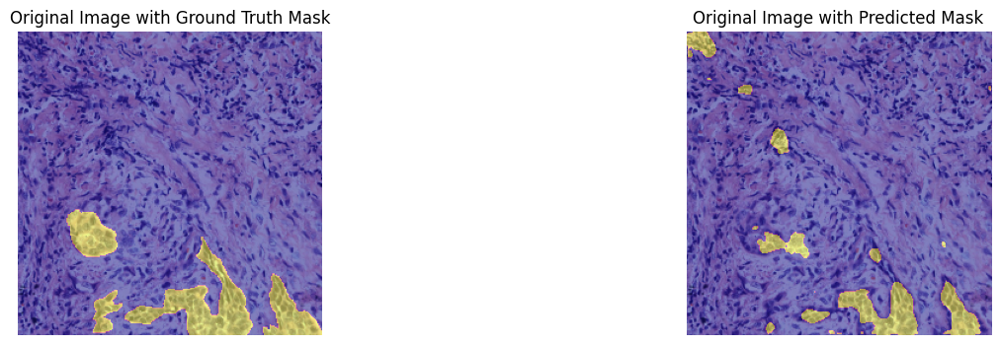

Epoch 6 Loss: 0.3550, Accuracy: 84.97%
Epoch 6 Validation Loss: 0.3232, Validation Accuracy: 86.75%, Dice: 0.8475%, IOU: 0.7354%, PQ: 0.7183, aji 0.5328%, Specificity: 0.6401%, Sensitivity: 0.8418%


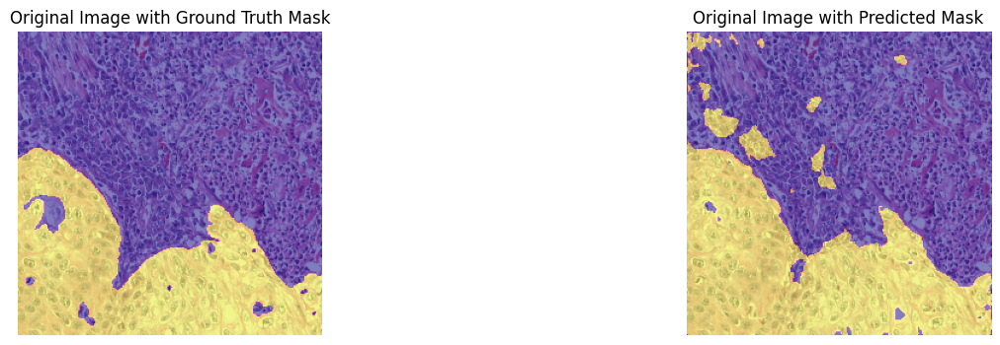

Epoch 7 Loss: 0.3505, Accuracy: 84.98%
Epoch 7 Validation Loss: 0.3119, Validation Accuracy: 86.69%, Dice: 0.8367%, IOU: 0.7212%, PQ: 0.7038, aji 0.5163%, Specificity: 0.7552%, Sensitivity: 0.7798%


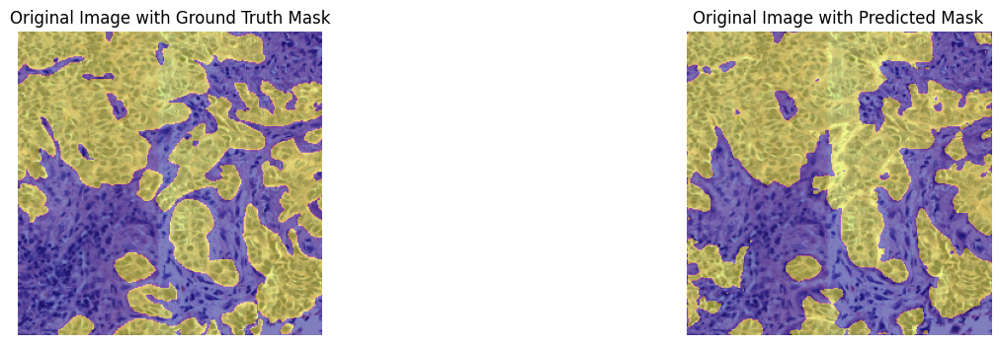

Epoch 8 Loss: 0.3378, Accuracy: 86.02%
Epoch 8 Validation Loss: 0.3217, Validation Accuracy: 86.84%, Dice: 0.8501%, IOU: 0.7364%, PQ: 0.7226, aji 0.5546%, Specificity: 0.6037%, Sensitivity: 0.8528%


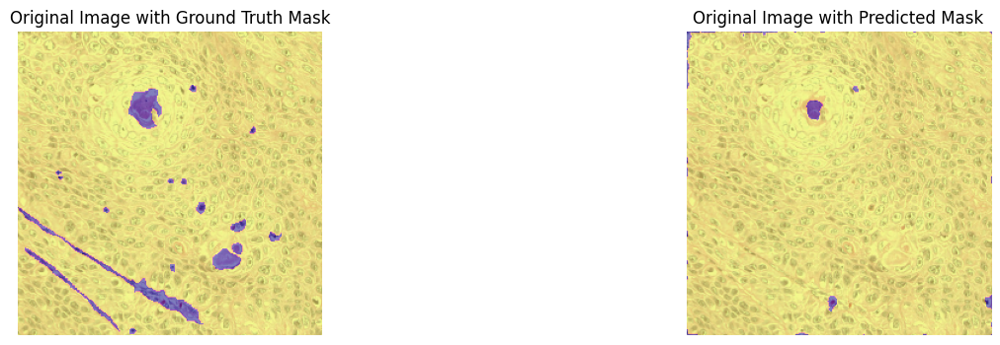

Epoch 9 Loss: 0.3826, Accuracy: 83.07%
Epoch 9 Validation Loss: 0.3265, Validation Accuracy: 86.77%, Dice: 0.8439%, IOU: 0.7318%, PQ: 0.7129, aji 0.5273%, Specificity: 0.6732%, Sensitivity: 0.8173%


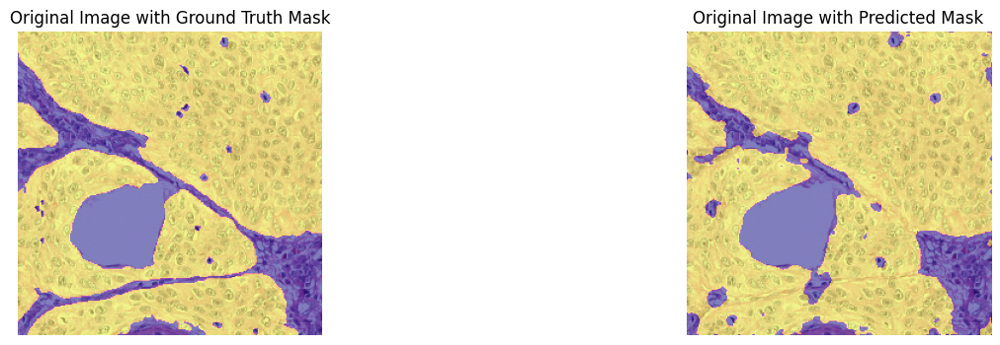

Epoch 10 Loss: 0.3456, Accuracy: 85.32%
Epoch 10 Validation Loss: 0.3450, Validation Accuracy: 86.30%, Dice: 0.8352%, IOU: 0.7153%, PQ: 0.6994, aji 0.5210%, Specificity: 0.6831%, Sensitivity: 0.7939%


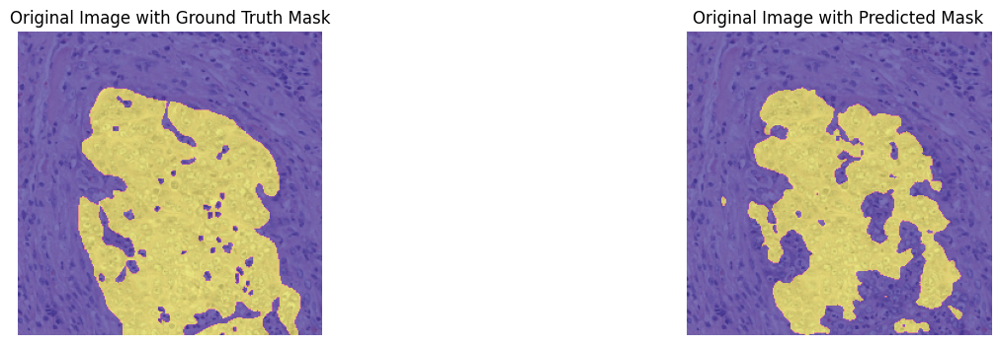

Epoch 11 Loss: 0.3598, Accuracy: 84.64%
Epoch 11 Validation Loss: 0.3531, Validation Accuracy: 86.01%, Dice: 0.8412%, IOU: 0.7279%, PQ: 0.7076, aji 0.5331%, Specificity: 0.5989%, Sensitivity: 0.8474%


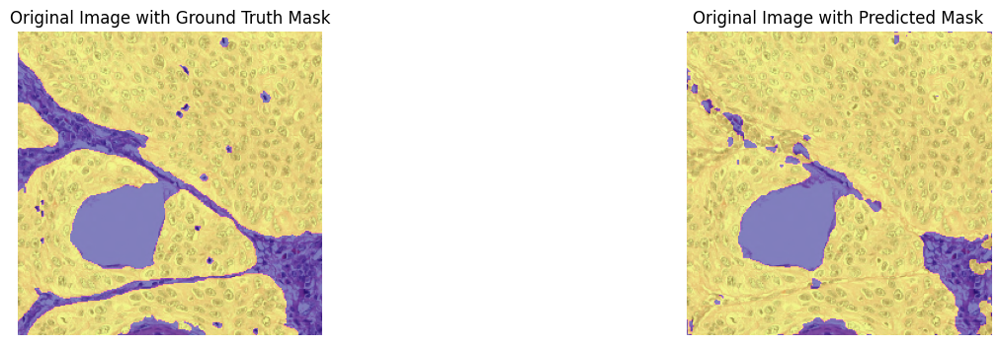

Epoch 12 Loss: 0.3565, Accuracy: 84.72%
Epoch 12 Validation Loss: 0.3344, Validation Accuracy: 85.89%, Dice: 0.8346%, IOU: 0.7151%, PQ: 0.6970, aji 0.4937%, Specificity: 0.6407%, Sensitivity: 0.8138%


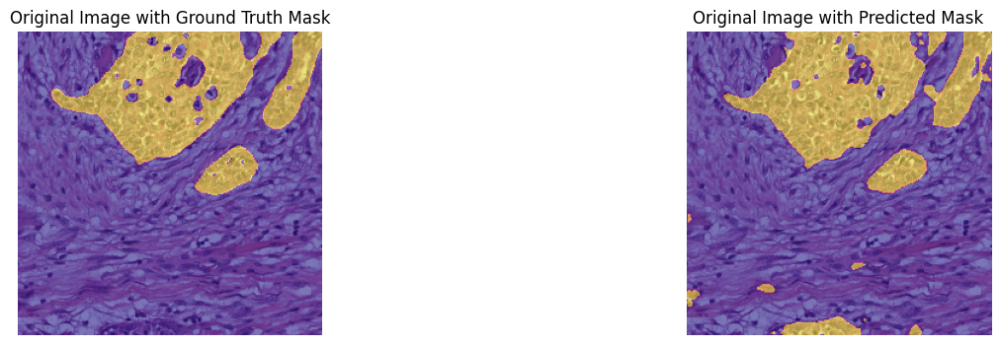

Epoch 13 Loss: 0.3507, Accuracy: 85.48%
Epoch 13 Validation Loss: 0.3140, Validation Accuracy: 87.26%, Dice: 0.8493%, IOU: 0.7361%, PQ: 0.7221, aji 0.5343%, Specificity: 0.7154%, Sensitivity: 0.8205%


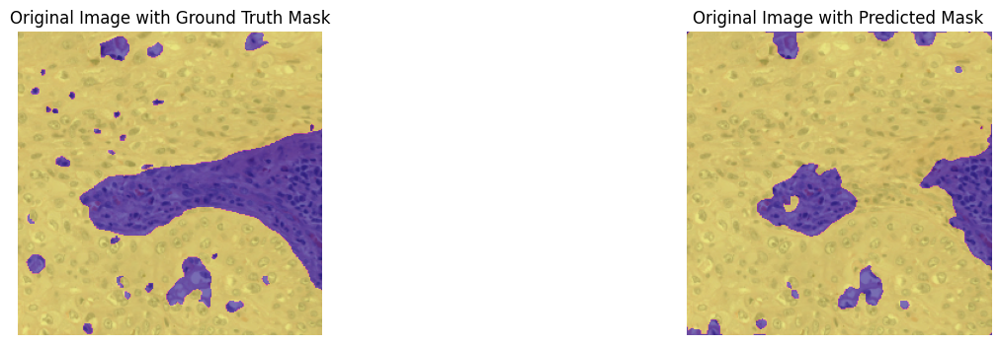

Epoch 14 Loss: 0.3068, Accuracy: 87.26%
Epoch 14 Validation Loss: 0.2879, Validation Accuracy: 87.96%, Dice: 0.8668%, IOU: 0.7667%, PQ: 0.7521, aji 0.5902%, Specificity: 0.5735%, Sensitivity: 0.8958%


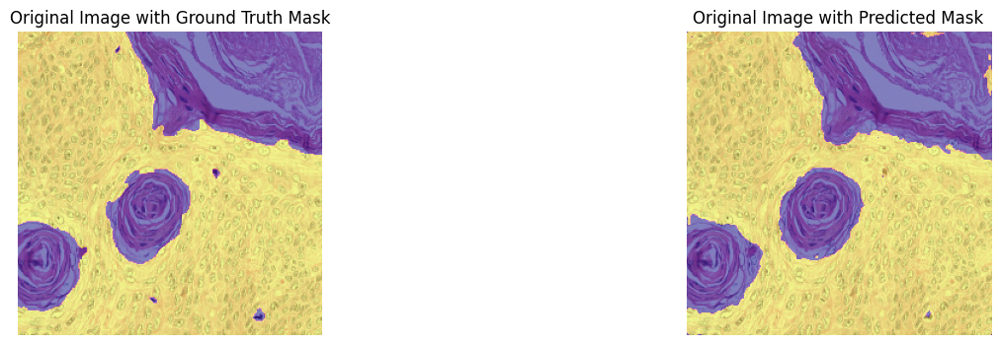

Epoch 15 Loss: 0.3191, Accuracy: 86.51%
Epoch 15 Validation Loss: 0.2740, Validation Accuracy: 89.13%, Dice: 0.8781%, IOU: 0.7830%, PQ: 0.7713, aji 0.6107%, Specificity: 0.6382%, Sensitivity: 0.8950%


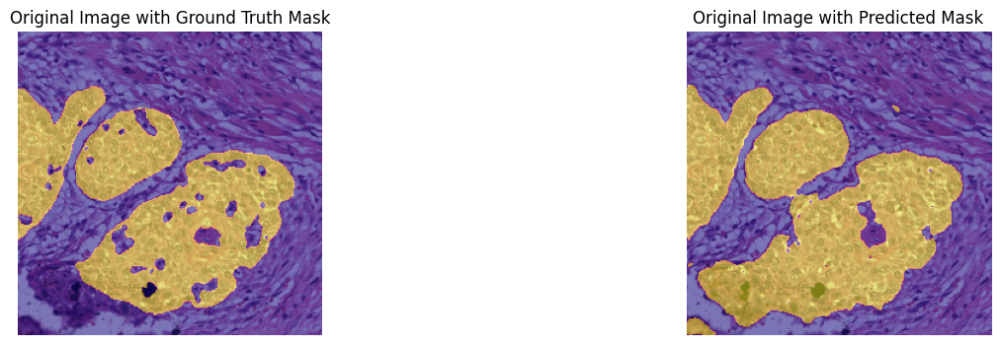

Epoch 16 Loss: 0.3253, Accuracy: 86.06%
Epoch 16 Validation Loss: 0.3012, Validation Accuracy: 88.25%, Dice: 0.8618%, IOU: 0.7576%, PQ: 0.7433, aji 0.5933%, Specificity: 0.6553%, Sensitivity: 0.8377%


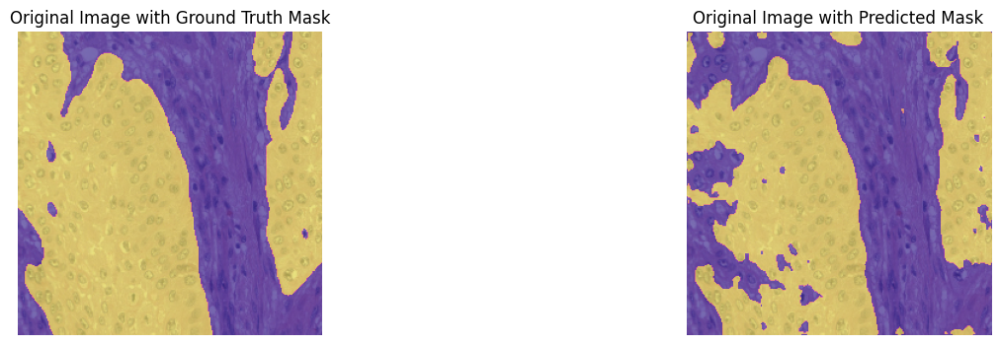

Epoch 17 Loss: 0.3265, Accuracy: 86.30%
Epoch 17 Validation Loss: 0.2792, Validation Accuracy: 88.82%, Dice: 0.8714%, IOU: 0.7725%, PQ: 0.7594, aji 0.5761%, Specificity: 0.6638%, Sensitivity: 0.8667%


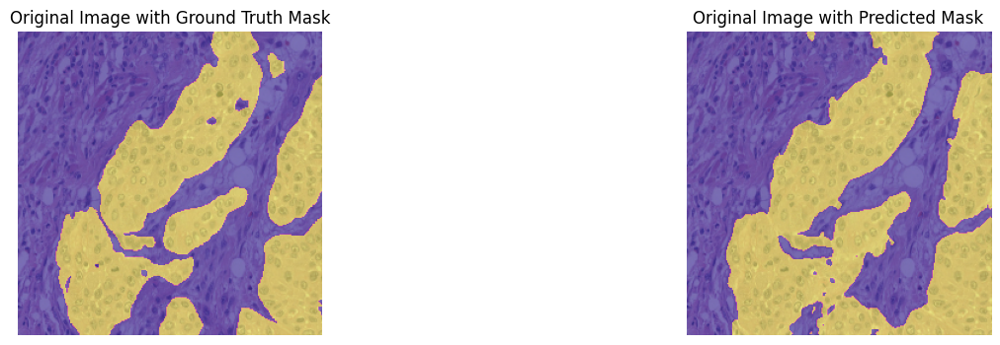

Epoch 18 Loss: 0.3013, Accuracy: 87.49%
Epoch 18 Validation Loss: 0.2834, Validation Accuracy: 88.78%, Dice: 0.8661%, IOU: 0.7651%, PQ: 0.7516, aji 0.5768%, Specificity: 0.7423%, Sensitivity: 0.8300%


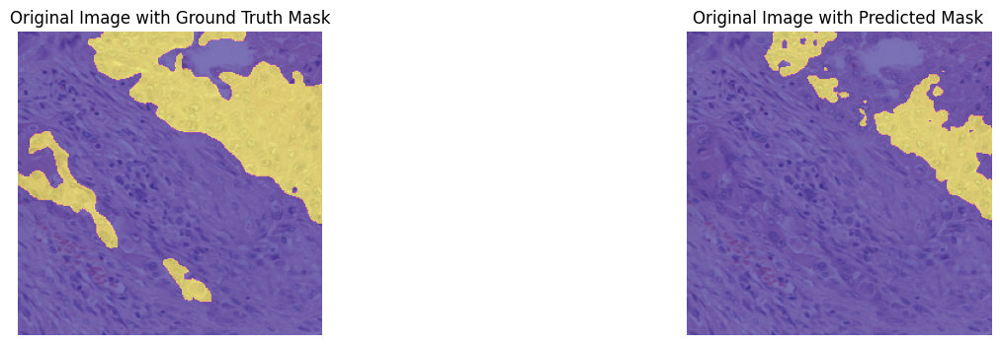

Epoch 19 Loss: 0.3151, Accuracy: 86.45%
Epoch 19 Validation Loss: 0.2707, Validation Accuracy: 89.18%, Dice: 0.8700%, IOU: 0.7688%, PQ: 0.7589, aji 0.5991%, Specificity: 0.7714%, Sensitivity: 0.8280%


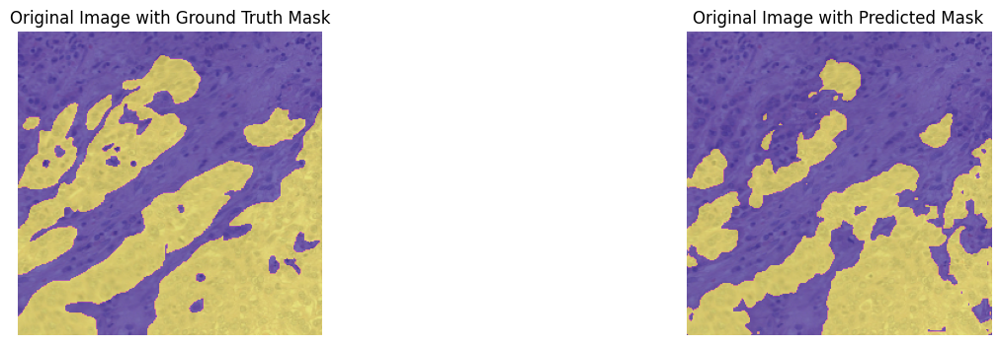

Epoch 20 Loss: 0.3099, Accuracy: 86.97%
Epoch 20 Validation Loss: 0.3187, Validation Accuracy: 85.98%, Dice: 0.8353%, IOU: 0.7187%, PQ: 0.6982, aji 0.5092%, Specificity: 0.6604%, Sensitivity: 0.8127%


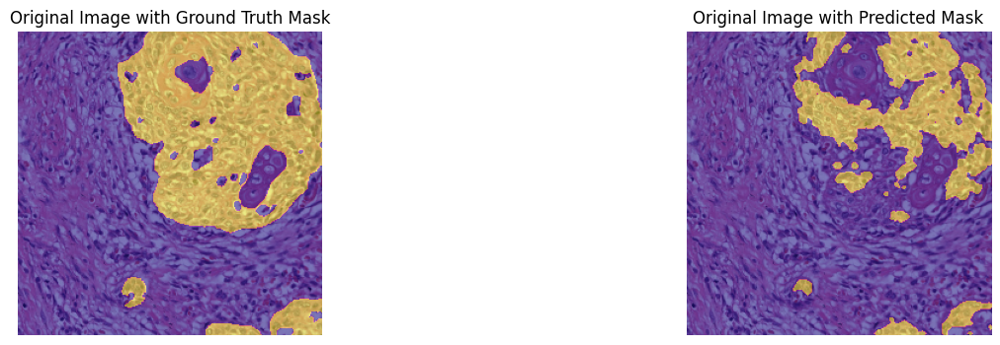

In [5]:
channels = 3
classes = 1
model = UNet(channels, classes)
input_data = torch.randn(1, channels, width, height)
output = model(input_data)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
model.to(device)

num_epochs = epochs

#training
train_losses = []
accuracies = []
val_losses = []
val_accuracies = []
dice = []
iou_values = []
specificity = []
sensitivity = []
pq_values = []
aji_values = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    

    for images, masks in tqdm(train_dataloader, desc=f'Epoch {epoch + 1}/{num_epochs}', leave=False):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)

        loss = F.binary_cross_entropy(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        #thresholding the prediction values
        _, predicted = torch.max(outputs, 1)
        binary_predictions = (outputs > 0.5).float()
        
        #calculating the correct pixels
        correct_predictions += (binary_predictions == masks).sum().item()

        total_samples += masks.numel()

    epoch_loss = running_loss / len(train_dataloader)
    epoch_accuracy = correct_predictions / total_samples

    train_losses.append(epoch_loss)
    accuracies.append(epoch_accuracy)

    

    print(f"Epoch {epoch + 1} Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy * 100:.2f}%")

    val_running_loss = 0.0
    val_correct_predictions = 0
    val_total_samples = 0
    val_true_positives = 0
    val_true_negatives = 0
    val_false_positives = 0
    val_false_negatives = 0
    val_iou = 0
    val_specificity = 0
    val_sensitivity = 0
    val_pq = 0
    val_aji = 0
    batch_iou = 0

    with torch.no_grad():
        for val_images, val_masks in test_dataloader:
            val_images, val_masks = val_images.to(device), val_masks.to(device)
            val_outputs = model(val_images)

            val_loss = F.binary_cross_entropy(val_outputs, val_masks)
            val_running_loss += val_loss.item()

            #thresholding the prediction values
            val_binary_predictions = (val_outputs > 0.5).float()

            #calculating the correct pixels
            val_correct_predictions += (val_binary_predictions == val_masks).sum().item()
            val_total_samples += val_masks.numel()
            val_true_negatives = ((val_binary_predictions == 0) & (val_masks == 0)).sum().item()

            val_true_positives += ((val_binary_predictions == 1) & (val_masks == 1)).sum().item()
            #calculating the false positives
            val_false_positives += ((val_binary_predictions == 1) & (val_masks == 0)).sum().item()

            #calculating the false negatives
            val_false_negatives += ((val_binary_predictions == 0) & (val_masks == 1)).sum().item()

            #calculating iou
            intersection = torch.logical_and(val_binary_predictions, val_masks).sum().item()
            union = torch.logical_or(val_binary_predictions, val_masks).sum().item()
            iou = intersection / union if union > 0 else 0.0
            batch_iou += iou

            #calculating aji
            val_aji += (intersection / union) * (val_true_positives/(val_true_positives+val_false_positives+val_false_negatives))

    #precision and recall
    precision = val_true_positives / (val_true_positives + val_false_positives)
    recall = val_true_positives / (val_true_positives + val_false_negatives)

    #specificity and sensitivity
    val_sensitivity = recall
    val_specificity = val_true_negatives / (val_true_negatives + val_false_positives)
    specificity.append(val_specificity)
    sensitivity.append(val_sensitivity)

    #epoch loss and accuracy
    val_epoch_loss = val_running_loss / len(test_dataloader)
    val_epoch_accuracy = val_correct_predictions / val_total_samples
    val_losses.append(val_epoch_loss)
    val_accuracies.append(val_epoch_accuracy)

    #dice
    val_temp_dice = (2 * val_true_positives) / (2 * val_true_positives + val_false_positives + val_false_negatives)
    dice.append(val_temp_dice)

    #pq
    val_pq = precision * recall
    pq_values.append(val_pq)

    #iou
    iou = batch_iou / len(test_dataloader)
    iou_values.append(iou)

    #aji
    aji = val_aji / len(test_dataloader)
    aji_values.append(aji) 


    print(f"Epoch {epoch + 1} Validation Loss: {val_epoch_loss:.4f}, Validation Accuracy: {val_epoch_accuracy * 100:.2f}%, Dice: {val_temp_dice:.4f}%, IOU: {iou:.4f}%, PQ: {val_pq:.4f}, aji {aji:.4f}%, Specificity: {val_specificity:.4f}%, Sensitivity: {val_sensitivity:.4f}%")
    if(show_images):
        with torch.no_grad():
            for images, masks in test_dataloader:
                images, masks = images.to(device), masks.to(device)

                if torch.any(masks > 0):
                    outputs = model(images)
                    probs = outputs

                    images_np = images.cpu().numpy()
                    masks_np = masks.cpu().numpy()
                    probs_np = probs.cpu().numpy()

                    threshold = 0.5
                    preds_np = (probs_np > threshold).astype(np.uint8)
                    preds_np_squeezed = np.squeeze(preds_np, axis=1) 

                    plt.figure(figsize=(16, 4))

                    plt.subplot(1, 2, 1)
                    plt.imshow(images_np[0].transpose((1, 2, 0)))
                    plt.imshow(masks_np[0, 0], alpha=0.5, cmap='plasma')
                    plt.title("Original Image with Ground Truth Mask")
                    plt.axis('off')

                    plt.subplot(1, 2, 2)
                    plt.imshow(images_np[0].transpose((1, 2, 0)))
                    plt.imshow(preds_np_squeezed[0], alpha=0.5, cmap='plasma')
                    plt.title("Original Image with Predicted Mask")
                    plt.axis('off')

                    plt.show()

                    break




### Plotting Charts

- **Accuracy**: The number of correct predictions out of the total of predictions. Higher means better.

- **Loss**: How well the predictions matched the expected result. Lower means better.

- **Dice**: Calculates the similarity between the intersection of two images. Higher means better.

- **Intersection over Union (IoU)**: It calculates the overlap between the predicted image and the ground truth, but it also takes in consideration the union of the boxes, while Dice only accounts for the intersection.Higher means better.

- **Panoptic Quality (PQ)**: Indicates the performance in segmenting instances accurately. Higher means better.

- **Aggregated Jaccard Index (AJI)**: Indicate the performance of the alignment between predicted and ground truth instance boundaries. Higher means better.

- **Specificity**: Measures the proportion of actual negatives that are correctly identified. Higher means better.

- **Sensitivity**: Measures the proportion of actual positives that are correctly identified. Higher means better.



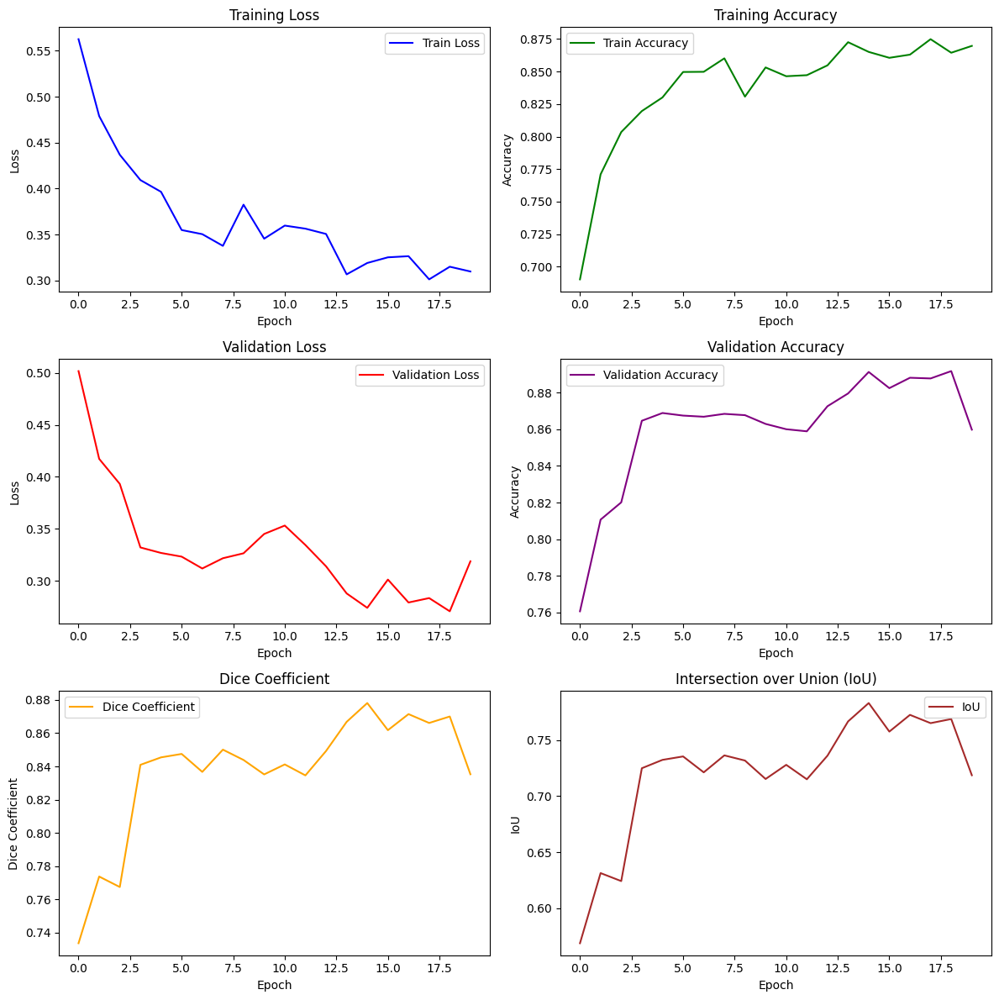

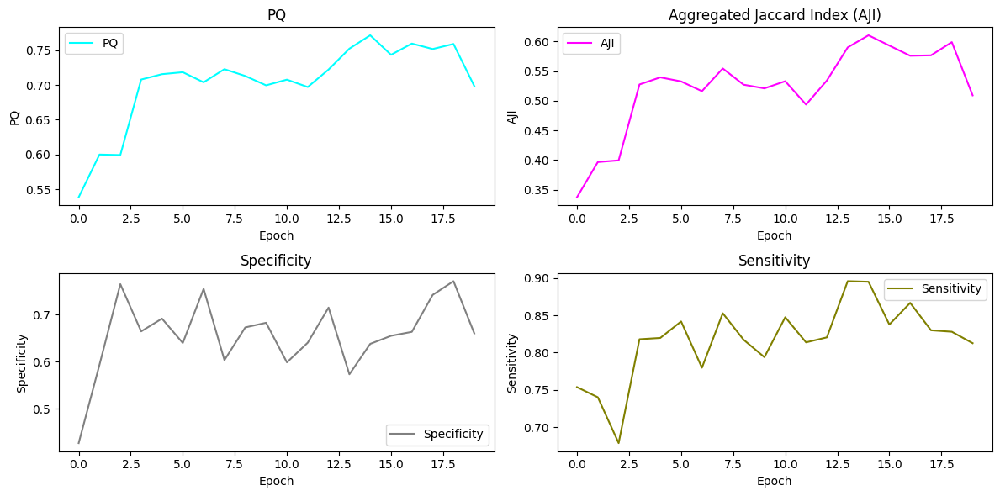

In [6]:
import matplotlib.pyplot as plt


plt.figure(figsize=(12, 12))

plt.subplot(3, 2, 1)
plt.plot(train_losses, label='Train Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()


plt.subplot(3, 2, 2)
plt.plot(accuracies, label='Train Accuracy', color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()


plt.subplot(3, 2, 3)
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()


plt.subplot(3, 2, 4)
plt.plot(val_accuracies, label='Validation Accuracy', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()


plt.subplot(3, 2, 5)
plt.plot(dice, label='Dice Coefficient', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Dice Coefficient')
plt.title('Dice Coefficient')
plt.legend()


plt.subplot(3, 2, 6)
plt.plot(iou_values, label='IoU', color='brown')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('Intersection over Union (IoU)')
plt.legend()

plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))


plt.subplot(2, 2, 1)
plt.plot(pq_values, label='PQ', color='cyan')
plt.xlabel('Epoch')
plt.ylabel('PQ')
plt.title('PQ')
plt.legend()


plt.subplot(2, 2, 2)
plt.plot(aji_values, label='AJI', color='magenta')
plt.xlabel('Epoch')
plt.ylabel('AJI')
plt.title('Aggregated Jaccard Index (AJI)')
plt.legend()


plt.subplot(2, 2, 3)
plt.plot(specificity, label='Specificity', color='gray')
plt.xlabel('Epoch')
plt.ylabel('Specificity')
plt.title('Specificity')
plt.legend()


plt.subplot(2, 2, 4)
plt.plot(sensitivity, label='Sensitivity', color='olive')
plt.xlabel('Epoch')
plt.ylabel('Sensitivity')
plt.title('Sensitivity')
plt.legend()

plt.tight_layout()
plt.show()


### Doing Predictions

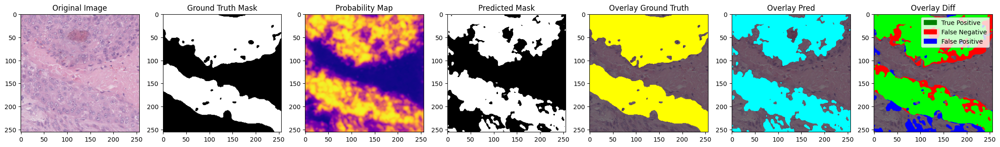

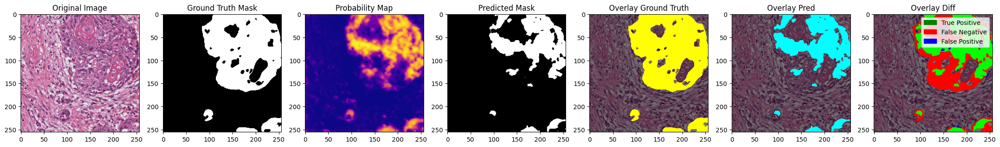

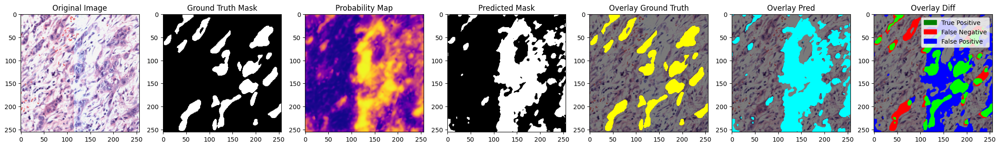

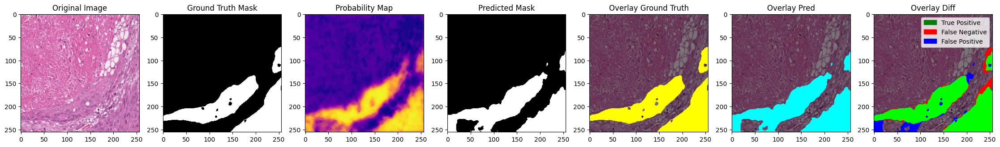

In [7]:
import torch.nn.functional as F
import matplotlib.patches as mpatches
if show_images:
    with torch.no_grad():
        counter = 0
        brightness = 0.5
        for images, masks in test_dataloader:
            images, masks = images.to(device), masks.to(device)
            images_normalized = images

            outputs = model(images_normalized)
            probs = outputs
            #probs = F.softmax(outputs, dim=1)

            images_np = images_normalized.cpu().numpy()
            masks_np = masks.cpu().numpy()
            probs_np = probs.cpu().numpy()

            threshold = 0.5
            preds_np = (probs_np > threshold).astype(np.uint8)
            preds_np_squeezed = np.squeeze(preds_np, axis=1) 

            original_image = images_np[0].transpose((1, 2, 0))
            ground_truth_mask = masks_np[0, 0]
            predicted_mask = preds_np_squeezed[0]
            probability_map = probs_np[0, 0]

            overlay_gt = original_image.copy()
            overlay_gt = original_image * brightness # to make it a little darker
            overlay_gt[ground_truth_mask == 1] = [1, 1, 0]

            overlay_pred = original_image.copy()
            overlay_pred = original_image * brightness
            overlay_pred[predicted_mask == 1] = [0, 1, 1]

            overlay_diff = original_image.copy()
            overlay_diff = original_image * brightness 
            overlay_diff[(ground_truth_mask == 1) & (predicted_mask == 1)] = [0, 1, 0]  #correct predictions
            overlay_diff[(ground_truth_mask == 1) & (predicted_mask == 0)] = [1, 0, 0]  #missed predictions
            overlay_diff[(ground_truth_mask == 0) & (predicted_mask == 1)] = [0, 0, 1]  #false positives

            plt.figure(figsize=(28, 4))

            plt.subplot(1, 7, 1)
            plt.imshow(original_image)
            plt.title("Original Image")

            plt.subplot(1, 7, 2)
            plt.imshow(ground_truth_mask, cmap='gray')
            plt.title("Ground Truth Mask")

            plt.subplot(1, 7, 3)
            plt.imshow(probability_map, cmap='plasma')
            plt.title("Probability Map")

            plt.subplot(1, 7, 4)
            plt.imshow(predicted_mask, cmap='gray')
            plt.title("Predicted Mask")

            plt.subplot(1, 7, 5)
            plt.imshow(overlay_gt)
            plt.title("Overlay Ground Truth")

            plt.subplot(1, 7, 6)
            plt.imshow(overlay_pred)
            plt.title("Overlay Pred")

            green_patch = mpatches.Patch(color='green', label='True Positive')
            red_patch = mpatches.Patch(color='red', label='False Negative')
            blue_patch = mpatches.Patch(color='blue', label='False Positive')
            plt.subplot(1, 7, 7)
            plt.imshow(overlay_diff)
            plt.title("Overlay Diff")
            plt.legend(handles=[green_patch, red_patch, blue_patch], loc='upper right')

            plt.show()

            counter += 1
            if counter == 10:
                break